In [1]:
from word_generation import get_random_sea_floor,draw_sea_floor

In [2]:
Z = get_random_sea_floor(10)

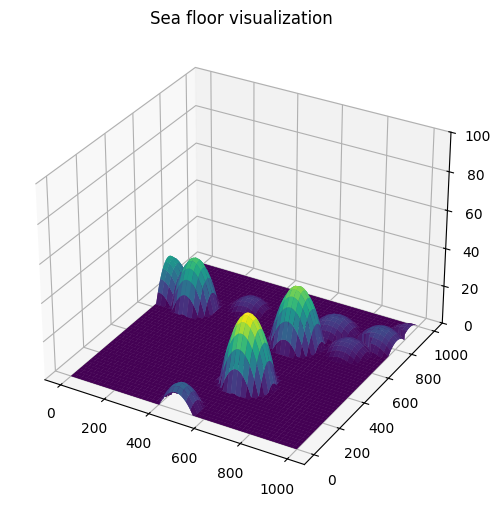

In [3]:
draw_sea_floor(Z)

In [4]:
import numpy as np
import random
import plotly.graph_objects as go
from submarine import Submarine, simulate_random
from word_generation import get_random_sea_floor, add_wrecks, wrecs_coordinates

N = 1000
Z = get_random_sea_floor(8)
add_wrecks(8)
wrecks = wrecs_coordinates[:]
max_hill = np.max(Z)
subs = []
for _ in range(3):
    x = random.randint(0, N-1)
    y = random.randint(0, N-1)
    ground = Z[x, y]
    altitude = max_hill +5
    subs.append(Submarine(x, y, z=altitude, speed=2.0))
history = simulate_random(Z, subs, wrecks, time_steps=1000)
paths_x = [[] for _ in subs]
paths_y = [[] for _ in subs]
paths_z = [[] for _ in subs]
probs = [[] for _ in subs]
for step_data in history:
    for i, data in enumerate(step_data):
        px, py, pz = data['pos']
        paths_x[i].append(px)
        paths_y[i].append(py)
        paths_z[i].append(pz)
        probs[i].append(data['prob'])
fig = go.Figure()
x_coords = np.arange(N)
y_coords = np.arange(N)
X, Y = np.meshgrid(x_coords, y_coords)
fig.add_trace(go.Surface(x=X, y=Y, z=Z, name='Sea Floor', colorscale='Viridis', opacity=0.7))
for i in range(len(subs)):
    fig.add_trace(go.Scatter3d(
        x=paths_x[i],
        y=paths_y[i],
        z=paths_z[i],
        mode='lines',
        name=f"Submarine {i+1}"
    ))
wx = [wreck[0] for wreck in wrecks]
wy = [wreck[1] for wreck in wrecks]
wz = [wreck[2] for wreck in wrecks]
fig.add_trace(go.Scatter3d(
    x=wx,
    y=wy,
    z=[z+1 for z in wz],
    mode='markers',
    marker=dict(symbol='x', size=8, color='red'),
    name='Wrecks'
))
fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        zaxis=dict(range=[0, 100])
    ),
    width=900,
    height=700
)
fig.show()


In [5]:
print(history)

[[{'pos': (np.float64(224.67524931603728), np.float64(315.9075075610712), np.float64(32.46205707858318)), 'prob': 1.0}, {'pos': (np.float64(255.03897982333336), np.float64(535.6070625155239), np.float64(32.46205707858318)), 'prob': 1.0}, {'pos': (np.float64(725.9737626700283), np.float64(875.0001721067762), np.float64(32.46205707858318)), 'prob': np.float64(0.8635272424448802)}], [{'pos': (np.float64(226.35049863207456), np.float64(314.8150151221424), np.float64(32.46205707858318)), 'prob': 1.0}, {'pos': (np.float64(253.07795964666673), np.float64(535.2141250310478), np.float64(32.46205707858318)), 'prob': 1.0}, {'pos': (np.float64(725.9475253400567), np.float64(873.0003442135524), np.float64(32.46205707858318)), 'prob': np.float64(0.8724203741564351)}], [{'pos': (np.float64(228.02574794811184), np.float64(313.72252268321364), np.float64(32.46205707858318)), 'prob': 1.0}, {'pos': (np.float64(251.1169394700001), np.float64(534.8211875465718), np.float64(32.46205707858318)), 'prob': 1.0}